# Atmospheric (ATL09) Workflow
This notebook ({nb-download}`download <IS2_ATL09_workflow.ipynb>`) illustrates the use of icepyx for running a basic ATL09 workflow from data access to plotting. It incudes:
- programmatic ICESat-2 data query and download from the NASA NSIDC DAAC (NASA National Snow and Ice Data Center Distributed Active Archive Center)
- data read in to an Xarray DataSet
- plotting of calibrated attenuated backscatter

Additional notebooks within the icepyx [documentation](https://icepyx.readthedocs.io/en/latest/) showcase some of the functionalities used herein in more detail.

Import packages, including icepyx

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
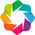

In [1]:
import icepyx as ipx
import os
import shutil
import xarray as xr
%matplotlib inline

## Key Steps in this Workflow

1. Define your parameters (spatial, temporal, dataset, etc.)
2. Query the NSIDC API to find out more information about the dataset
3. Log in to NASA Earthdata
4. Order and download your data
5. Create an object ("container") to hold your read-in parameters
6. Read in your data
7. Select the profile you'd like to plot
8. Plot your data

icepyx streamlines this process into a minimal number of lines of code that leverage existing tools.

### Create an icepyx query object with the desired search parameters

There are three required inputs, depending on how you want to search for data. Two are required in all cases:
- `short_name` = the data product of interest, known as its "short name".
See https://nsidc.org/data/icesat-2/data-sets for a list of the available data products.
- `spatial extent` = a region of interest to search within. This can be entered as a bounding box, polygon vertex coordinate pairs, or a polygon geospatial file (currently shp, kml, and gpkg are supported).
    - bounding box: Given in decimal degrees for the lower left longitude, lower left latitude, upper right longitude, and upper right latitude
    - polygon vertices: Given as longitude, latitude coordinate pairs of decimal degrees with the last entry a repeat of the first.
    - polygon file: A string containing the full file path and name.

*NOTE: You can submit at most one bounding box or a list of lonlat polygon coordinates per object instance.
Per NSIDC requirements, geospatial polygon files may only contain one feature (polygon).*

Then, for all non-gridded products (ATL<=13), you must include AT LEAST one of the following inputs (temporal or orbital constraints):
- `date_range` = the date range for which you would like to search for results. Must be formatted as a set of 'YYYY-MM-DD' strings separated by a comma.
- `cycles` = Which orbital cycle to use, input as a numerical string or a list of strings. If no input is given, this value defaults to all available cycles within the search parameters.  An orbital cycle refers to the 91-day repeat period of the ICESat-2 orbit.
- `tracks` = Which [Reference Ground Track (RGT)](https://icesat-2.gsfc.nasa.gov/science/specs) to use, input as a numerical string or a list of strings. If no input is given, this value defaults to all available RGTs within the spatial and temporal search parameters.

Here we'll use a pre-determined bounding box of the west coast of Africa

In [ ]:
# bounding box - all of Africa
short_name = 'ATL09'
spatial_extent = [-20, -40, 60, 40]
date_range = ['2022-05-01','2022-05-01']

In [2]:
# bounding box - NW coast of Africa
short_name = 'ATL09'
spatial_extent = [-20, 0, -10, 40]
date_range = ['2020-06-17','2020-06-18']

Create the data object using our inputs

In [3]:
region = ipx.Query(short_name, spatial_extent, date_range)

You can make sure you've got the right area by plotting the spatial extent.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
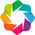

:Overlay
   .WMTS.I :WMTS   [Longitude,Latitude]
   .Path.I :Path   [Longitude,Latitude]

In [4]:
region.visualize_spatial_extent()

### More information about your query object
icepyx makes it easy to learn more about your query parameters, ICESat-2 data products, and the various request urls you are sending to NSIDC. To learn more about these features, check out the [Accessing ICESat-2 Data](https://icepyx.readthedocs.io/en/latest/example_notebooks/IS2_data_access.html) example.

### Querying a data product
It is often helpful to know roughly how much data we can expect, or make sure we are getting the granule we expect.

In [5]:
#search for available granules and provide basic summary info about them
region.avail_granules()

{'Number of available granules': 3,
 'Average size of granules (MB)': 2329.1609245936,
 'Total size of all granules (MB)': 6987.4827737808}

In [6]:
#get a list of granule IDs for the available granules
region.avail_granules(ids=True)

[['ATL09_20200617224933_12740701_005_01.h5',
  'ATL09_20200618112352_12820701_005_01.h5',
  'ATL09_20200618222354_12890701_005_01.h5']]

### Log in to NASA Earthdata
To access ICESat-2 data, we must first authenticate ourselves using a valid Earthdata login. There are multiple ways to provide your Earthdata credentials via icepyx. The in-notebook login is used below; passwords are entered but not shown or stored in plain text by the system.

In [7]:
earthdata_uid = 'icepyx_devteam'
email = 'icepyx.dev@gmail.com'
region.earthdata_login(earthdata_uid, email)

Earthdata Login password: ········


ConnectionError: HTTPSConnectionPool(host='n5eil02u.ecs.nsidc.org', port=443): Max retries exceeded with url: /egi/capabilities/ATL09.005.xml (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x18ca0fa00>: Failed to establish a new connection: [Errno 61] Connection refused'))

### Place and Download the order
When you access ICESat-2 data from NSIDC, first the data is ordered and then you are able to download it. icepyx allows you to run these commands separately (`order_granules()`), or you can just use `download_granules` to order and download with one function.

#### A Note about Subsetting

icepyx makes it easy to take advantage of the reformatting (e.g. file format conversion) and subsetting options offered by NSIDC. Spatial subsetting to your input region will happen automatically, and you can further reduce file size and complexity by requesting only the variables you need (most products have more than 200 variable fields!). These options and how to use them are covered in more detail in the [Subsetting Tutorial Notebook](https://icepyx.readthedocs.io/en/latest/example_notebooks/IS2_data_access2-subsetting.html).

In [8]:
# specify where you want the data downloaded to
path_root = '/Users/jessica/computing/icepyx/github_repo/icepyx/doc/source/example_notebooks/download_atmos/'

In [9]:
region.download_granules(path_root)

AttributeError: 'Query' object has no attribute '_session'

### Opening Your Data
Now that we have some data downloaded, we can move on to opening it. For more details on this process, see the [Reading ICESat-2 data in for Analysis](https://icepyx.readthedocs.io/en/latest/example_notebooks/IS2_data_read-in.html) example.

To help icepyx find the right files, we'll create a filename pattern for it to use to find matching files.

In [10]:
pattern = "processed_ATL{product:2}_{datetime:%Y%m%d%H%M%S}_1274{cycle:2}{orbitsegment:2}_{version:3}_{revision:2}.h5"
# pattern = "processed_ATL{product:2}_{datetime:%Y%m%d%H%M%S}_{rgt:4}{cycle:2}{orbitsegment:2}_{version:3}_{revision:2}.h5"


Then we need to create a `ipx.Read` object that holds the filenames and to which we'll add information about what groups and variables we would like to load into memory.

In [11]:
reader = ipx.Read(path_root, "ATL09", pattern) # or ipx.Read(filepath, "ATLXX") if your filenames match the default

You have 1 files matching the filename pattern to be read in.


In [ ]:
reader._filelist

We can get a list of available variables by peeking at the first file in our list.

In [12]:
reader.vars.avail()

['ancillary_data/atlas_sdp_gps_epoch',
 'ancillary_data/atmosphere/a_m1',
 'ancillary_data/atmosphere/a_m2',
 'ancillary_data/atmosphere/aclr_use_atlas',
 'ancillary_data/atmosphere/alpha_day_pce1',
 'ancillary_data/atmosphere/alpha_day_pce2',
 'ancillary_data/atmosphere/alpha_day_pce3',
 'ancillary_data/atmosphere/alpha_night_pce1',
 'ancillary_data/atmosphere/alpha_night_pce2',
 'ancillary_data/atmosphere/alpha_night_pce3',
 'ancillary_data/atmosphere/alpha_twilight_pce1',
 'ancillary_data/atmosphere/alpha_twilight_pce2',
 'ancillary_data/atmosphere/alpha_twilight_pce3',
 'ancillary_data/atmosphere/asr_cal_factor',
 'ancillary_data/atmosphere/atlas_bandpass_fw',
 'ancillary_data/atmosphere/atlas_tele_fov',
 'ancillary_data/atmosphere/backg_max_solar_elev',
 'ancillary_data/atmosphere/backg_min_solar_elev',
 'ancillary_data/atmosphere/backg_select',
 'ancillary_data/atmosphere/bs_bin_thresh',
 'ancillary_data/atmosphere/bs_downsample',
 'ancillary_data/atmosphere/bs_extinc_backs',
 'a

Then we need to tell icepyx which variables to actually load.

In [13]:
reader.vars.append(var_list=["cab_prof", "latitude", "longitude"])

If we print out the list of variables we've requested, you'll see it's a lot more manageable now!

In [15]:
reader.vars.wanted

{'sc_orient': ['orbit_info/sc_orient'],
 'atlas_sdp_gps_epoch': ['ancillary_data/atlas_sdp_gps_epoch'],
 'cycle_number': ['orbit_info/cycle_number'],
 'rgt': ['orbit_info/rgt'],
 'data_start_utc': ['ancillary_data/data_start_utc'],
 'data_end_utc': ['ancillary_data/data_end_utc'],
 'cab_prof': ['profile_1/high_rate/cab_prof',
  'profile_2/high_rate/cab_prof',
  'profile_3/high_rate/cab_prof'],
 'latitude': ['profile_1/high_rate/latitude',
  'profile_1/low_rate/latitude',
  'profile_2/high_rate/latitude',
  'profile_2/low_rate/latitude',
  'profile_3/high_rate/latitude',
  'profile_3/low_rate/latitude'],
 'longitude': ['profile_1/high_rate/longitude',
  'profile_1/low_rate/longitude',
  'profile_2/high_rate/longitude',
  'profile_2/low_rate/longitude',
  'profile_3/high_rate/longitude',
  'profile_3/low_rate/longitude']}

Then we simply load the data into memory and icepyx takes care of all the heavy lifting to combine our individual granule files.

In [16]:
# don't print out the new warnings from Xarray - icepyx dev team is working on addressing these
import warnings
warnings.filterwarnings('ignore')

ds = reader.load()

In [17]:
ds

<xarray.Dataset>
Dimensions:              (gran_idx: 1, photon_idx: 48810, ds_va_bin_h: 700,
                          spot: 3)
Coordinates:
  * gran_idx             (gran_idx) uint64 127407
  * photon_idx           (photon_idx) int64 0 1 2 3 ... 48806 48807 48808 48809
  * ds_va_bin_h          (ds_va_bin_h) float32 2e+04 1.997e+04 ... -925.5 -955.5
  * spot                 (spot) uint8 1 2 3
    source_file          (gran_idx) <U144 '/Users/jessica/computing/icepyx/gi...
    delta_time           (photon_idx) datetime64[ns] 2020-06-17T23:26:11.0119...
Data variables:
    sc_orient            (gran_idx) int8 0
    cycle_number         (gran_idx) int8 7
    rgt                  (gran_idx) int16 1274
    atlas_sdp_gps_epoch  (gran_idx) datetime64[ns] 2018-01-01T00:00:18
    data_start_utc       (gran_idx) datetime64[ns] 2020-06-17T22:49:32.905878
    data_end_utc         (gran_idx) datetime64[ns] 2020-06-18T00:23:50.148715
    cab_prof             (spot, gran_idx, photon_idx, ds_va_bin_h) float32 na...
    latitude             (spot, gran_idx, photon_idx) float64 40.0 ... 0.001454
    longitude            (spot, gran_idx, photon_idx) float64 -14.99 ... -19.31
    gt                   (gran_idx, spot) <U9 'profile_1' ... 'profile_3'
Attributes:
    data_product:  ATL09

Extract a single profile for plotting

In [18]:
profile = ds.sel(spot=1).isel(gran_idx=0)
profile

<xarray.Dataset>
Dimensions:              (photon_idx: 48810, ds_va_bin_h: 700)
Coordinates:
    gran_idx             uint64 127407
  * photon_idx           (photon_idx) int64 0 1 2 3 ... 48806 48807 48808 48809
  * ds_va_bin_h          (ds_va_bin_h) float32 2e+04 1.997e+04 ... -925.5 -955.5
    spot                 uint8 1
    source_file          <U144 '/Users/jessica/computing/icepyx/github_repo/i...
    delta_time           (photon_idx) datetime64[ns] 2020-06-17T23:26:11.0119...
Data variables:
    sc_orient            int8 0
    cycle_number         int8 7
    rgt                  int16 1274
    atlas_sdp_gps_epoch  datetime64[ns] 2018-01-01T00:00:18
    data_start_utc       datetime64[ns] 2020-06-17T22:49:32.905878
    data_end_utc         datetime64[ns] 2020-06-18T00:23:50.148715
    cab_prof             (photon_idx, ds_va_bin_h) float32 nan nan ... nan nan
    latitude             (photon_idx) float64 40.0 40.0 39.99 ... nan nan nan
    longitude            (photon_idx) float64 -14.99 -14.99 -14.99 ... nan nan
    gt                   <U9 'profile_1'
Attributes:
    data_product:  ATL09

Minor data management for plotting

In [19]:
profile = profile.set_coords("latitude")

In [20]:
profile["latitude"] = profile.latitude.fillna(0)
profile["ds_va_bin_h"] = profile.ds_va_bin_h.fillna(0)

Create our plot!

Text(0.5, 1.0, '17 June 2020 Saharan Dust')

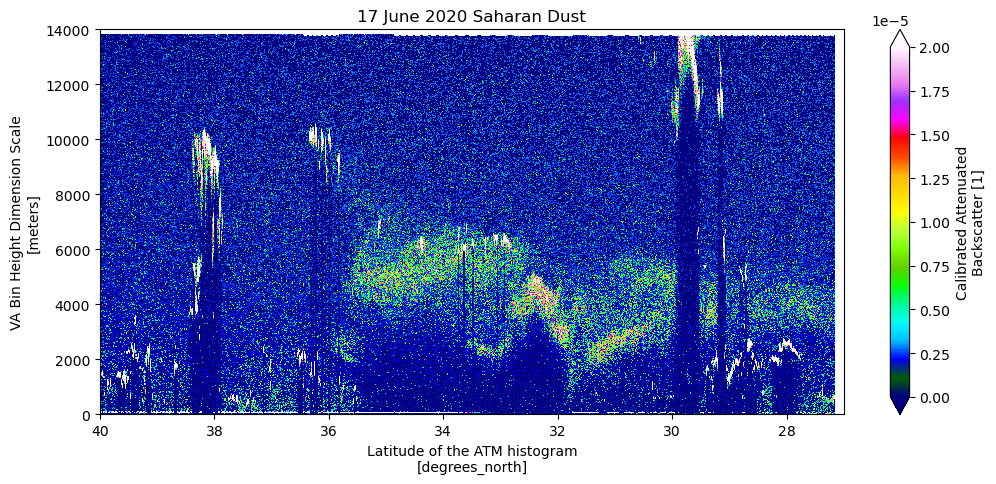

In [21]:
fig = xr.plot.imshow(profile.cab_prof, x="latitude", y="ds_va_bin_h", 
                     vmin=0, vmax=2e-5, 
                     cmap="gist_ncar",
                     figsize=(12, 5),
                        )
fig.axes.set_xlim(40,27)
fig.axes.set_ylim(0,14000)
fig.axes.set_title("17 June 2020 Saharan Dust")

Compare our plot with Steve's version

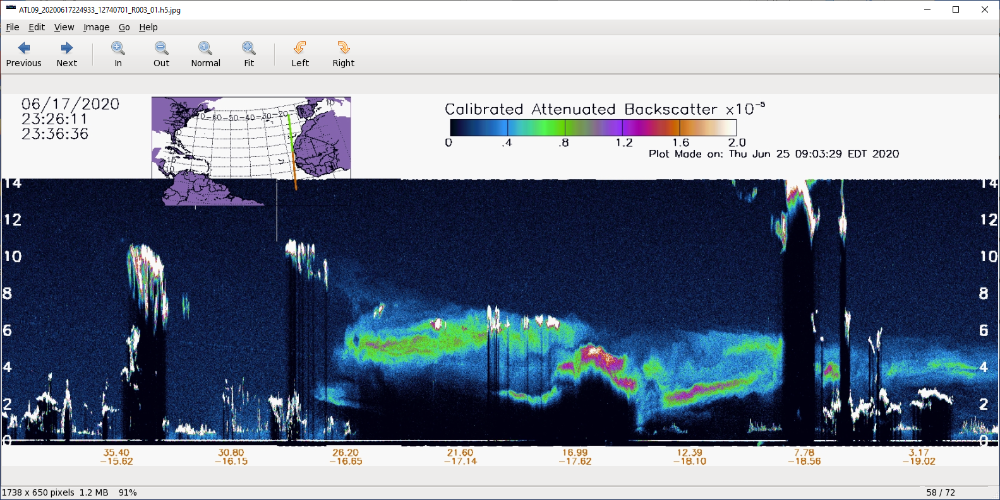

**Credits**
* original notebook by: Jessica Scheick
* created for: 

#### Graphing this data took some trial and error!
Things that didn't work (but were easy to find examples of!)

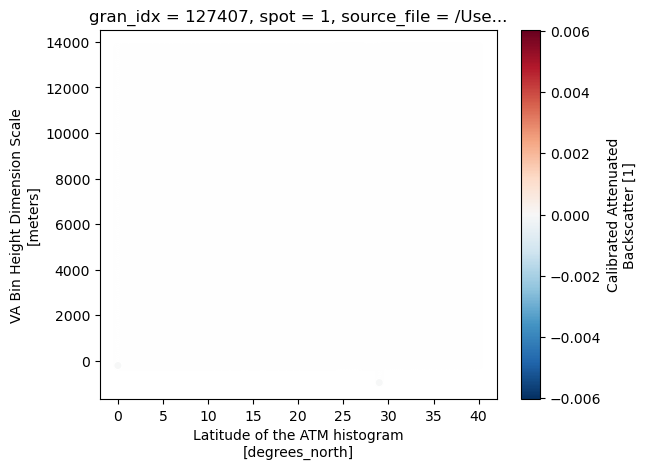

In [22]:
profile.plot.scatter(x="latitude", y="ds_va_bin_h", hue="cab_prof")  #generates a blank plot; also not the appropriate type of plot

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [4., 0., 0., ..., 0., 0., 0.],
        [4., 0., 0., ..., 0., 0., 0.],
        [4., 0., 0., ..., 0., 0., 0.]]),
 array([-1.73389901e-06,  6.01634849e-04,  1.20500359e-03,  1.80837244e-03,
         2.41174106e-03,  3.01510980e-03,  3.61847878e-03,  4.22184728e-03,
         4.82521625e-03,  5.42858476e-03,  6.03195373e-03]),
 <a list of 700 BarContainer objects>)

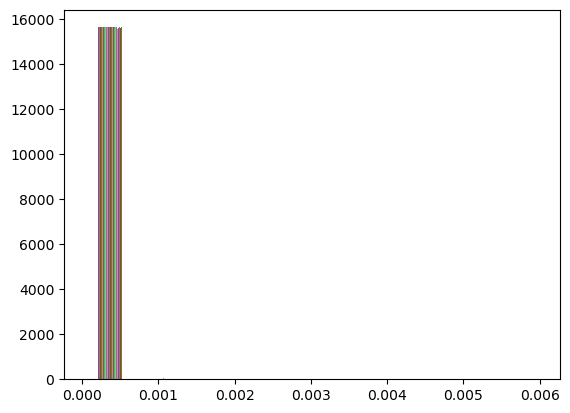

In [23]:
import matplotlib.pyplot as plt
plt.hist(profile.cab_prof) # illustrates how critical narrowing our range of calibrated backscatter values is

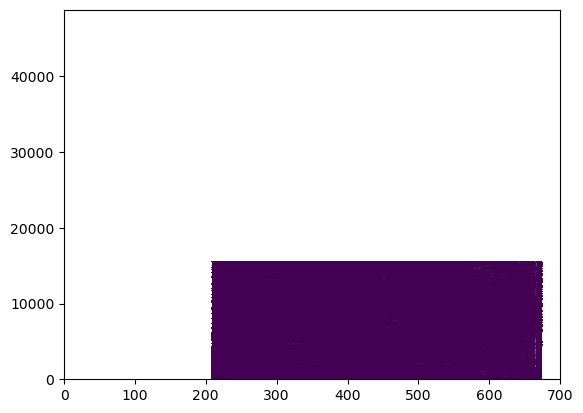

In [25]:
plt.pcolormesh(profile.cab_prof.data) # axes labeled by index instead of value